In [1]:
#import sys
#sys.path.append('../input/pytorch-image-models/pytorch-image-models-master')
import collections
import gc
import json
import os
import random
import time
import warnings
from pprint import pprint
warnings.simplefilter("ignore")

from mpl_toolkits.axes_grid1 import ImageGrid
from albumentations import *
from albumentations.pytorch import ToTensor
import cv2
from imblearn.under_sampling import RandomUnderSampler
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
from PIL import Image, ImageFilter
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
#import tifffile as tiff
import timm
import torch
import torch.backends.cudnn as cudnn
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import DataLoader, Dataset, sampler
#from tqdm import tqdm_notebook as tqdm
from tqdm import tqdm
from collections import Counter

import s3fs
fs = s3fs.S3FileSystem()

%matplotlib inline
print(os.listdir())

['.git', '.gitignore', '.idea', '.ipynb_checkpoints', 'crop_original_size.ipynb', 'efficientnet_v0.ipynb', 'main.py', 'mnist.ipynb', 'networks', 'not_tracking1.png', 'not_tracking2.png', 'not_tracking3.png', 'no_tracking.png', 'readme.md', 'requirements.txt', 'resnet50_orig_size', 'resnet50_rescale_v2', 'resnet50_scaled', 'resnet50_tracking_v0(local).ipynb', 'resnet50_tracking_v1(local)_SORT.ipynb', 'resnet50_v0(local).ipynb', 'resnet50_v0(local)_old.ipynb', 'resnet50_v1(local)_orig_size.ipynb', 'resnet50_v1(local)_orig_size.py', 'resnet50_v1(local)_rescale.ipynb', 'show_plots.py', 'sub_resnet.csv', 'sub_resnet_800.csv', 'sub_tmp.csv', 'sub_trackingv1.csv', 'sub_trackingv2.csv', 'tracking.png', 'tracking1.png', 'tracking2.png', 'tracking3.png', 'zero_baseline.csv', 'zero_baseline_real.csv']


### setting

In [2]:
prefix = "D:\Data\wildcamdata"
DATASET = prefix
CROPED_DATA = os.path.join(DATASET, "256x256")

TRAIN_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_train")
TEST_CROPED_DATA = os.path.join(CROPED_DATA, "cropped_images_test")
MODEL_PATH = "./resnet50_rescale_v2"
if not os.path.isdir(MODEL_PATH):
    os.mkdir(MODEL_PATH)

In [3]:
BATCH_SIZE = 10
DEVICE = ('cuda' if torch.cuda.is_available() else 'cpu')
print(DEVICE)
EPOCHS = 300
NUM_WORKERS = 0
SEED = 2021

cuda


In [4]:
def set_seed(seed=2**3):
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
set_seed(SEED)

In [5]:
df_croped_img_ids_train = pd.read_csv(os.path.join(CROPED_DATA, "cropped_train.csv"))
df_croped_img_ids_test = pd.read_csv(os.path.join(CROPED_DATA, "cropped_test.csv"))

In [6]:
df_croped_img_ids_train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,374
1,905a4416-21bc-11ea-a13a-137349068a90,1,97
2,905a4416-21bc-11ea-a13a-137349068a90,2,97
3,905a4416-21bc-11ea-a13a-137349068a90,3,97
4,905a579e-21bc-11ea-a13a-137349068a90,1,90


In [7]:
df_croped_img_ids_test.head()

,id,idx
0,915879a0-21bc-11ea-a13a-137349068a90,1
1,91588116-21bc-11ea-a13a-137349068a90,1
2,9158a2f4-21bc-11ea-a13a-137349068a90,1
3,9158aaa6-21bc-11ea-a13a-137349068a90,1
4,9158f1a0-21bc-11ea-a13a-137349068a90,1


### create train dataframe

In [8]:
with open(os.path.join(DATASET, 'metadata\iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_train_annotation = pd.DataFrame(train_annotations["annotations"])

In [9]:
class_names = dict()
class_ids = []
for cat in train_annotations["categories"]:
    class_names[cat['id']] = cat['name']
    class_ids.append(cat['id'])
print(class_names)

{0: 'empty', 2: 'tayassu pecari', 3: 'dasyprocta punctata', 4: 'cuniculus paca', 6: 'puma concolor', 7: 'tapirus terrestris', 8: 'pecari tajacu', 9: 'mazama americana', 10: 'leopardus pardalis', 12: 'geotrygon montana', 13: 'nasua nasua', 14: 'dasypus novemcinctus', 15: 'eira barbara', 16: 'didelphis marsupialis', 20: 'procyon cancrivorus', 24: 'panthera onca', 25: 'myrmecophaga tridactyla', 26: 'tinamus major', 32: 'sylvilagus brasiliensis', 44: 'puma yagouaroundi', 50: 'leopardus wiedii', 62: 'mazama gouazoubira', 67: 'philander opossum', 70: 'capra aegagrus', 71: 'bos taurus', 72: 'ovis aries', 73: 'canis lupus', 74: 'lepus saxatilis', 77: 'turtur calcospilos', 78: 'papio anubis', 80: 'genetta genetta', 83: 'tragelaphus scriptus', 86: 'equus africanus', 89: 'herpestes sanguineus', 90: 'loxodonta africana', 91: 'cricetomys gambianus', 92: 'raphicerus campestris', 94: 'hyaena hyaena', 96: 'aepyceros melampus', 97: 'crocuta crocuta', 98: 'caracal caracal', 99: 'equus ferus', 100: 'pant

In [10]:
train = df_croped_img_ids_train[["id", "idx"]].merge(df_train_annotation[["image_id", "category_id"]], 
                                      left_on='id', right_on='image_id')[["id", "idx", "category_id"]]

In [11]:
df_categories = pd.DataFrame(train_annotations["categories"])
cat_idxs = df_categories["id"]

def convert_cat_to_index(x):
    return np.where(cat_idxs==x)[0][0]

In [12]:
print(convert_cat_to_index(3))
class_names[class_ids[2]]

2


'dasyprocta punctata'

In [13]:
train["category_id"] = train["category_id"].map(lambda x: convert_cat_to_index(x))

In [14]:
train.head()

,id,idx,category_id
0,905a3c8c-21bc-11ea-a13a-137349068a90,1,164
1,905a4416-21bc-11ea-a13a-137349068a90,1,39
2,905a4416-21bc-11ea-a13a-137349068a90,2,39
3,905a4416-21bc-11ea-a13a-137349068a90,3,39
4,905a579e-21bc-11ea-a13a-137349068a90,1,34


# Train

## Create dataset for training

In [15]:
# ====================================================
# Dataset for train
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

def img2tensor(img,dtype:np.dtype=np.float32):
    if img.ndim==2 : img = np.expand_dims(img,2)
    img = np.transpose(img,(2,0,1))
    return torch.from_numpy(img.astype(dtype, copy=False))

def imgscalepad(im, desired_size):
    old_size = im.shape[:2] # old_size is in (height, width) format

    ratio = float(desired_size)/max(old_size)
    new_size = tuple([int(x*ratio) for x in old_size])

    # new_size should be in (width, height) format

    im = cv2.resize(im, (new_size[1], new_size[0]))

    delta_w = desired_size - new_size[1]
    delta_h = desired_size - new_size[0]
    top, bottom = delta_h//2, delta_h-(delta_h//2)
    left, right = delta_w//2, delta_w-(delta_w//2)

    color = [0, 0, 0]
    new_im = cv2.copyMakeBorder(im, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color)
    return new_im

class IWildcamTrainDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idxs = df["idx"]
        self.categories = df["category_id"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idxs[idx]
        iamge_categorie = self.categories[idx]
        
        image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        #if len(img) * len(img[0]) > 256*256:
        #    ratio = (len(img) * len(img[0])) / (256.0*256.0)
        #    img = cv2.resize(img, (int(len(img)/ratio), int(len(img[0]/ratio))))
        img = cv2.resize(img, size)
        #plt.figure()
        #plt.imshow(img)
        #plt.show()

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0  - mean)/std), torch.tensor(iamge_categorie)

In [16]:
def get_aug(p=1.0):
    return Compose([
        HorizontalFlip(),
        ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=0.9, 
                         border_mode=cv2.BORDER_REFLECT),
        VerticalFlip(),
        RandomBrightnessContrast(p=0.9),
    ], p=p)

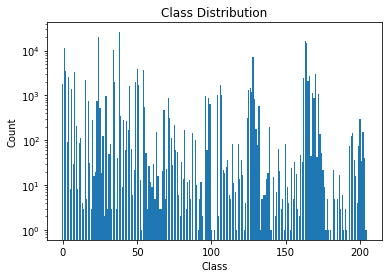

In [17]:
c = Counter(train["category_id"])
cats = c.keys()
vals = []
for cat in cats:
    vals.append(c[cat])
plt.figure()
plt.yscale("log")
plt.bar(cats, vals)
plt.title("Class Distribution")
plt.ylabel("Count")
plt.xlabel("Class")
plt.show()

In [18]:
# Remove classes with less than 10 data points
bad_classes = []
for i in range(len(class_names)):
    if i not in cats:
        bad_classes.append(i)
for cat in cats:
    if c[cat] < 100:
        bad_classes.append(cat)
print(len(bad_classes), bad_classes)
print(train[pd.DataFrame(train.category_id.tolist()).isin(bad_classes).any(1).values])
print(len(pd.DataFrame(train.category_id.tolist()).isin(bad_classes).any(1).values))
print(train[~pd.DataFrame(train.category_id.tolist()).isin(bad_classes).any(1).values])
train = train[~pd.DataFrame(train.category_id.tolist()).isin(bad_classes).any(1).values]

139 [88, 95, 101, 103, 141, 181, 184, 192, 167, 97, 18, 161, 131, 177, 111, 175, 21, 89, 64, 60, 118, 171, 193, 197, 56, 160, 37, 31, 114, 199, 32, 3, 120, 46, 11, 48, 150, 61, 145, 76, 74, 112, 52, 42, 90, 58, 174, 178, 152, 77, 85, 182, 190, 138, 40, 92, 137, 110, 70, 198, 196, 154, 157, 121, 146, 176, 57, 67, 156, 22, 10, 80, 36, 143, 186, 81, 201, 84, 108, 94, 30, 113, 115, 13, 183, 119, 47, 65, 188, 147, 7, 158, 203, 151, 144, 93, 136, 109, 179, 142, 26, 148, 86, 187, 189, 69, 134, 78, 122, 5, 53, 159, 191, 59, 135, 33, 155, 62, 153, 180, 66, 14, 133, 16, 123, 19, 116, 185, 83, 140, 117, 79, 105, 91, 28, 149, 204, 100, 102]
                                          id  idx  category_id
36      905b1fb2-21bc-11ea-a13a-137349068a90    1          167
63      905be4e2-21bc-11ea-a13a-137349068a90    1           97
107     905df9ee-21bc-11ea-a13a-137349068a90    1           18
258     906280d6-21bc-11ea-a13a-137349068a90    1          161
411     906617b4-21bc-11ea-a13a-137349068a90    

In [19]:
# split into val and train
good_classes = list(set([i for i in range(len(class_names))]) - set(bad_classes))
print(good_classes)

split = .80
new_train = pd.DataFrame()
val = pd.DataFrame()
for i, c in enumerate(good_classes): 
    class_data = train[train["category_id"] == c]
    class_data["category_id"] = i
    subset_val = class_data.sample(frac=1-split)
    subset_train = class_data[(~class_data.isin(subset_val)).any(1).values]
    new_train = new_train.append(subset_train)
    val = val.append(subset_val)
train = new_train.sample(frac=1)
val = val.sample(frac=1)

[0, 1, 2, 128, 4, 129, 6, 130, 8, 9, 132, 139, 12, 15, 17, 20, 23, 24, 25, 27, 29, 34, 35, 162, 163, 38, 39, 164, 41, 165, 43, 44, 45, 166, 168, 169, 49, 50, 51, 172, 173, 54, 55, 63, 194, 195, 68, 71, 72, 73, 200, 75, 202, 82, 87, 170, 96, 98, 99, 104, 106, 107, 124, 125, 126, 127]


tayassu pecari


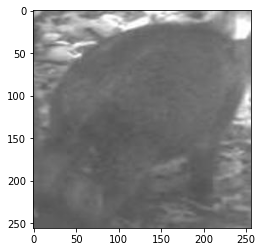

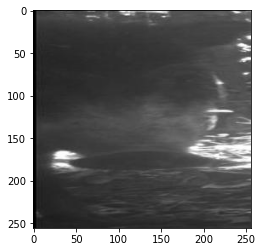

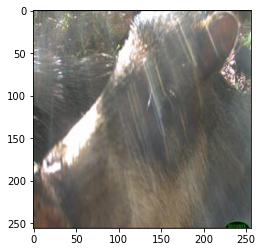

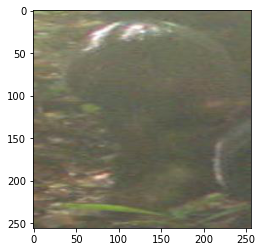

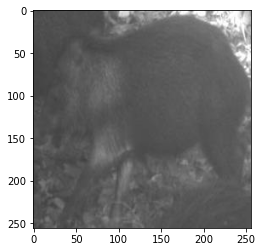

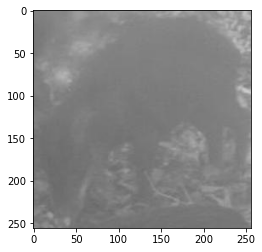

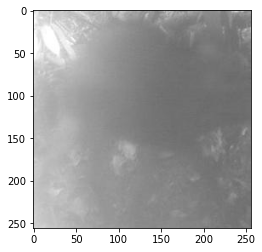

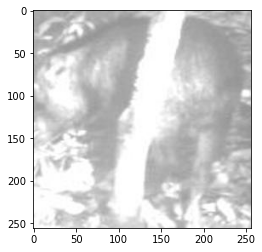

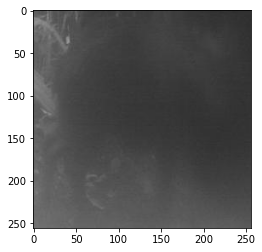

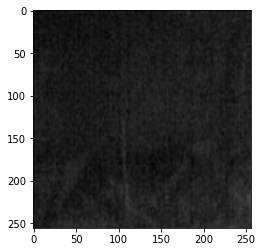

In [20]:
show_class = 1
print(class_names[class_ids[good_classes[show_class]]])
df = train[train["category_id"] == 1]
for image_id, image_idx in zip(df["id"][:10], df["idx"][:10]):
    image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

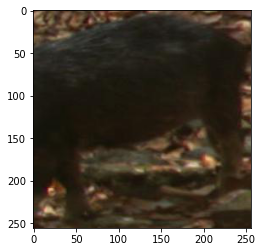

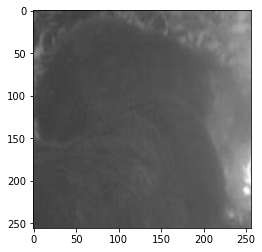

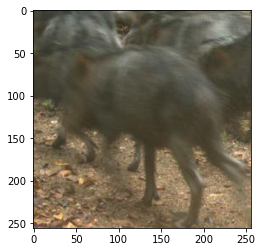

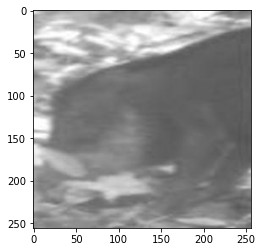

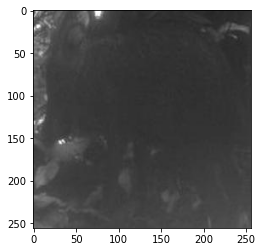

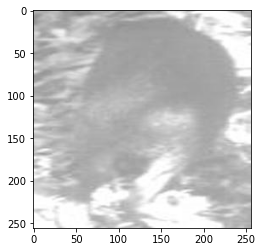

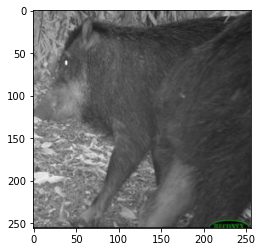

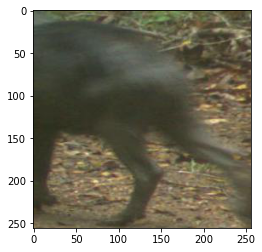

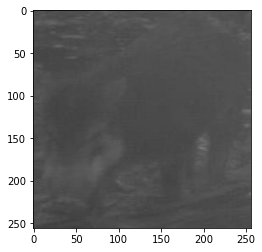

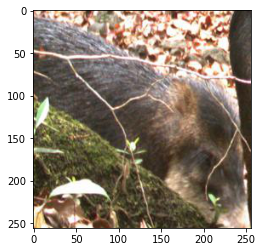

In [21]:
df = val[val["category_id"] == 1]
for image_id, image_idx in zip(df["id"][:10], df["idx"][:10]):
    image_path = os.path.join(TRAIN_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
    img = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    plt.imshow(img)
    plt.show()

In [22]:
print(timm.list_models(pretrained=True))

['adv_inception_v3', 'cait_m36_384', 'cait_m48_448', 'cait_s24_224', 'cait_s24_384', 'cait_s36_384', 'cait_xs24_384', 'cait_xxs24_224', 'cait_xxs24_384', 'cait_xxs36_224', 'cait_xxs36_384', 'coat_lite_mini', 'coat_lite_tiny', 'cspdarknet53', 'cspresnet50', 'cspresnext50', 'densenet121', 'densenet161', 'densenet169', 'densenet201', 'densenetblur121d', 'dla34', 'dla46_c', 'dla46x_c', 'dla60', 'dla60_res2net', 'dla60_res2next', 'dla60x', 'dla60x_c', 'dla102', 'dla102x', 'dla102x2', 'dla169', 'dm_nfnet_f0', 'dm_nfnet_f1', 'dm_nfnet_f2', 'dm_nfnet_f3', 'dm_nfnet_f4', 'dm_nfnet_f5', 'dm_nfnet_f6', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn107', 'dpn131', 'eca_nfnet_l0', 'eca_nfnet_l1', 'ecaresnet26t', 'ecaresnet50d', 'ecaresnet50d_pruned', 'ecaresnet50t', 'ecaresnet101d', 'ecaresnet101d_pruned', 'ecaresnet269d', 'ecaresnetlight', 'efficientnet_b0', 'efficientnet_b1', 'efficientnet_b1_pruned', 'efficientnet_b2', 'efficientnet_b2_pruned', 'efficientnet_b3', 'efficientnet_b3_pruned', 'efficientn

## Create model

In [23]:
# ====================================================
# Resnet Model
# ====================================================

class rnet(nn.Module):

    def __init__(self, backbone, out_dim, pretrained=False):
        super(rnet, self).__init__()
        self.rnet = timm.create_model(backbone, pretrained=pretrained)
        in_ch = self.rnet.fc.in_features
        self.rnet.fc = nn.Linear(in_ch, out_dim)
        #self.rnet.classifier = nn.Identity()

    def forward(self, x):
        x = self.rnet(x)
        return x

In [24]:
model = rnet(backbone="resnet50", out_dim=len(good_classes))
model.to(DEVICE)

rnet(
  (rnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act3):

## train setting

In [25]:
# ====================================================
# Optimizer and Loss
# ====================================================

optimizer = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
#optimizer = torch.optim.SGD([
#                {'params': model.parameters()},
#               {'params': model.classifier.parameters(), 'lr': 1e-4}
#            ], lr=1e-3, momentum=0.9)
criterion = nn.CrossEntropyLoss()

In [26]:
val.head()

,id,idx,category_id
36604,8d55e04a-21bc-11ea-a13a-137349068a90,1,0
3317,95fa0474-21bc-11ea-a13a-137349068a90,1,1
18428,9668195a-21bc-11ea-a13a-137349068a90,3,25
105874,8e60ae8e-21bc-11ea-a13a-137349068a90,1,55
86650,8f0acec8-21bc-11ea-a13a-137349068a90,1,46


## Train

Since we know that [the training data is imbalanced](https://www.kaggle.com/nayuts/iwildcam-2021-overviewing-for-start#EDA), I undersampled it.

In [27]:
rus = RandomUnderSampler(random_state=SEED, replacement=True)
from collections import Counter
def generate_dataloaders(train):
    
    train_resampled, _ = rus.fit_resample(train, train["category_id"])
    test_resampled, _ = rus.fit_resample(val, val["category_id"])
#     print(Counter(train["category_id"]))
#     print(len(Counter(train["category_id"])))
#     print(y)
#     print(y2)
#     print((train_resampled))
#     print((test_resampled))

    train_resampled = train_resampled.reset_index(drop=True)
    test_resampled = test_resampled.reset_index(drop=True)
    
    ds_train = IWildcamTrainDataset(train_resampled, tfms=get_aug())
    dl_train = DataLoader(ds_train,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    ds_test = IWildcamTrainDataset(test_resampled)
    dl_test = DataLoader(ds_test,batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS)
    
    return dl_train, dl_test
l_train, dl_test = generate_dataloaders(train)

In [ ]:
# ====================================================
# Train
# ====================================================
train_losses = []
val_losses = []
train_accs = []
val_accs = []

bar = tqdm(range(EPOCHS))
for epoch in bar:
    #bar.set_postfix(Epoch=epoch+1)
    
    dl_train, dl_test = generate_dataloaders(train)
    training_size = len(dl_train)
    validation_size = len(dl_test)
    
    ###Train
    model.train()
    train_loss = 0
    acc = 0
    
    for data in dl_train:
        optimizer.zero_grad()
        imgs, categories = data
        imgs = imgs.to(DEVICE)
        categories = categories.to(DEVICE)
        
        outputs = model(imgs)
        acc += np.sum([1 if torch.argmax(pred) == y else 0 for y, pred in zip(categories, outputs)])
    
        loss = criterion(outputs, categories)
        loss.backward()
        optimizer.step()
            
        train_loss += loss.item()
    train_loss /= len(dl_train)
        
    #print(f"EPOCH: {epoch + 1}, train_loss: {train_loss}")
    train_losses.append(train_loss)
    train_accs.append(acc/training_size)
    #bar.set_postfix(Epoch=epoch+1, Train_Loss=train_loss)
        
    ###Validation
    model.eval()
    valid_loss = 0
    acc = 0
        
    for data in dl_test:
        imgs, categories = data
        imgs = imgs.to(DEVICE)
        categories = categories.to(DEVICE)
        
        outputs = model(imgs)
        acc += np.sum([1 if torch.argmax(pred) == y else 0 for y, pred in zip(categories, outputs)])
    
        loss = criterion(outputs, categories)
        
        valid_loss += loss.item()
    valid_loss /= len(dl_test)
        
    #print(f"EPOCH: {epoch + 1}, valid_loss: {valid_loss}")
    val_losses.append(valid_loss)
    val_accs.append(acc/validation_size)
    bar.set_postfix(Train_Loss=train_loss, Val_Loss=valid_loss)
        
    
    if (epoch+1)%50 == 0 or (epoch+1)%EPOCHS == 0:
        ###Save model
        torch.save(model.state_dict(), os.path.join(MODEL_PATH, f"{epoch+1}_.pth"))

 53%|█ | 160/300 [11:02:42<9:39:57, 248.55s/it, Train_Loss=4.04, Val_Loss=4.31]

In [ ]:
plt.loglog()
plt.plot(train_losses)
plt.plot(val_losses)
plt.title("Resnet50 Loss")
plt.xlabel("Epoch")
plt.ylabel("Cross Validation Loss")
plt.legend(["Train loss", "Val loss"])

In [ ]:
plt.loglog()
plt.plot(train_accs)
plt.plot(val_accs)
plt.title("Resnet50 Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend(["Train", "Val"])

In [ ]:
with open(os.path.join(MODEL_PATH, f"train_losses.npy"), 'wb') as f:
    np.save(f, np.array(train_losses))
with open(os.path.join(MODEL_PATH, f"train_accs.npy"), 'wb') as f:
    np.save(f, np.array(train_accs))
with open(os.path.join(MODEL_PATH, f"val_losses.npy"), 'wb') as f:
    np.save(f, np.array(val_losses))
with open(os.path.join(MODEL_PATH, f"val_accs.npy"), 'wb') as f:
    np.save(f, np.array(val_accs))

# Inference

## Create dataset for test

In [19]:
# ====================================================
# Dataset for test
# ====================================================

mean = np.array([0.37087523, 0.370876, 0.3708759] )
std = np.array([0.21022698, 0.21022713, 0.21022706])

class IWildcamTestDataset(Dataset):
    def __init__(self, df, tfms=None):
        self.ids = df["id"]
        self.idx = df["idx"]
        self.tfms = tfms
        
    def __len__(self):
        return len(self.ids)
    
    def __getitem__(self, idx):
        size = (256, 256)
        image_id = self.ids[idx]
        image_idx = self.idx[idx]
        
        image_path = os.path.join(TEST_CROPED_DATA, f"{image_id}_{image_idx}.jpg")
        
        img = (cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB))

        if self.tfms is not None:
            augmented = self.tfms(image=img)
            img = augmented['image']
            
        # we should normalize here
        return img2tensor((img/255.0 - mean)/std), image_id

In [20]:
ds_test = IWildcamTestDataset(df_croped_img_ids_test)
dl_test = DataLoader(ds_test,batch_size=32,shuffle=False,num_workers=NUM_WORKERS)

## Load trained model

In [21]:
model = rnet(backbone="resnet50", out_dim=205)
model.to(DEVICE)
model.load_state_dict(torch.load(f"{800}_.pth"))
model.eval()

rnet(
  (rnet): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (act1): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act1): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act2): ReLU(inplace=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (act3):

In [73]:
pred_categories = []
pred_img_ids = []
pred_raw_outputs = []

## inference

In [74]:
with torch.no_grad():
    for imgs, img_ids in tqdm(dl_test):
        imgs = imgs.to(DEVICE)
        
        outputs = model(imgs)
        output_labels = torch.argmax(outputs, dim=1).tolist()
        pred_raw_outputs += outputs.tolist()
        pred_categories += output_labels
        pred_img_ids += img_ids

100%|██████████████████████████████████████| 1008/1008 [07:17<00:00,  2.30it/s]


In [76]:
pred = collections.defaultdict(list)
pred_values = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
    
for values, img_id in zip(pred_raw_outputs, pred_img_ids):
    pred_values[img_id].append(values)

In [77]:
pred

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [56],
             '91588116-21bc-11ea-a13a-137349068a90': [32],
             '9158a2f4-21bc-11ea-a13a-137349068a90': [198],
             '9158aaa6-21bc-11ea-a13a-137349068a90': [56],
             '9158f1a0-21bc-11ea-a13a-137349068a90': [57],
             '9159244a-21bc-11ea-a13a-137349068a90': [182],
             '91599f88-21bc-11ea-a13a-137349068a90': [4],
             '915a05ea-21bc-11ea-a13a-137349068a90': [74],
             '915a0cde-21bc-11ea-a13a-137349068a90': [87,
              87,
              201,
              201,
              201,
              201],
             '915a41b8-21bc-11ea-a13a-137349068a90': [99, 87, 50],
             '915a9f14-21bc-11ea-a13a-137349068a90': [66],
             '915aa658-21bc-11ea-a13a-137349068a90': [4],
             '915ad13c-21bc-11ea-a13a-137349068a90': [56],
             '915ad448-21bc-11ea-a13a-137349068a90': [99],
             '915b3d3e-21bc-11ea-a13a-137349068a90': [

In [78]:
pred_values

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [[4.124114990234375,
               0.559880256652832,
               3.6636056900024414,
               -2.479158401489258,
               2.8186070919036865,
               -2.0715739727020264,
               -3.658557653427124,
               -3.991208553314209,
               -2.2411117553710938,
               4.207794189453125,
               -1.6914749145507812,
               0.04407013952732086,
               -0.9904676675796509,
               -3.0810599327087402,
               0.21433311700820923,
               -2.9375674724578857,
               3.0776009559631348,
               3.5559022426605225,
               0.5843735337257385,
               -1.2866111993789673,
               3.248715400695801,
               -2.6295764446258545,
               3.4268720149993896,
               3.203130006790161,
               -2.0500192642211914,
               -3.116109848022461,
               -2.36363339

In [80]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]

In [81]:
df_test_info.head()

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


In [131]:
with open(os.path.join(DATASET, "metadata\\iwildcam2021_megadetector_results.json")) as f:
    megadetector = json.load(f)
print(megadetector["info"])
print(megadetector["detection_categories"])

{'format_version': '1.0', 'detector': 'megadetector_v3', 'detection_completion_time': '2020-01-10 08:49:05'}
{'2': 'person', '1': 'animal'}


In [220]:
boxes = collections.defaultdict(list)

for category, img_id in zip(pred_categories, pred_img_ids):
    pred[img_id].append(category)
for s in megadetector["images"]:
    for det in s["detections"]:
        if det["conf"] > .9:
            boxes[s["id"]].append(det['bbox'])

seqs = np.array(df_test_info["seq_id"].unique())

In [217]:
print(boxes["945336fe-21bc-11ea-a13a-137349068a90"])
for c in megadetector["images"]:
    if c["id"] == "945336fe-21bc-11ea-a13a-137349068a90":
        print(c)
        break

[]
{'detections': [{'category': '1', 'bbox': [0.5515, 0.4134, 0.036, 0.0598], 'conf': 0.754}, {'category': '1', 'bbox': [0.5549, 0.4148, 0.0308, 0.0376], 'conf': 0.477}, {'category': '1', 'bbox': [0.5449, 0.4125, 0.0436, 0.0855], 'conf': 0.349}], 'id': '945336fe-21bc-11ea-a13a-137349068a90', 'max_detection_conf': 0.754}


Seq 1, count: 1
ictonyx striatus
Seq 12, count: 1
potamochoerus larvatus
Seq 15, count: 1
ictonyx striatus
Seq 16, count: 0
Seq 17, count: 1
puma concolor
Seq 18, count: 0
Seq 19, count: 0
Seq 21, count: 0
ictonyx striatus
ictonyx striatus
ictonyx striatus
ictonyx striatus
ictonyx striatus
potamochoerus larvatus
cephalophus silvicultor
potamochoerus larvatus
potamochoerus larvatus
rusa unicolor
ictonyx striatus
ictonyx striatus
sylvilagus brasiliensis
sylvilagus brasiliensis
sylvilagus brasiliensis
sylvilagus brasiliensis
ictonyx striatus
orycteropus afer
puma concolor


IndexError: list index out of range

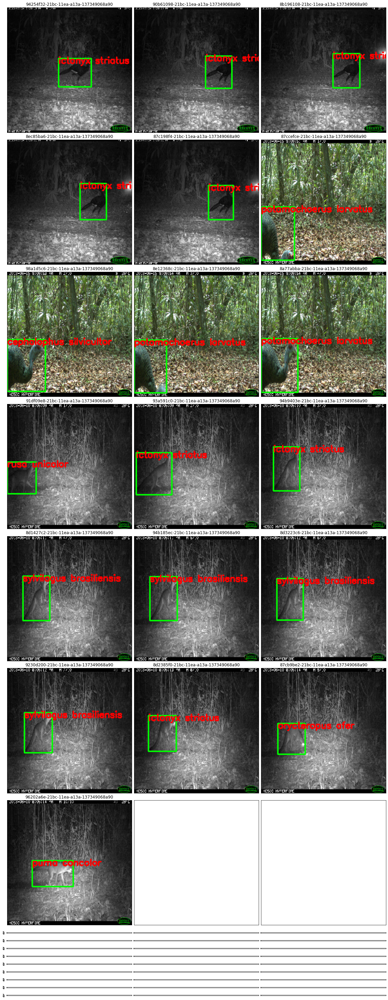

In [233]:
show = [1, 12, 15, 16, 17, 18, 19, 21]
im_ids = []
tot_imgs = 0
ims_pre_row = 3
match_thresh = .08
dist_thresh = .2
    
for seq_id in show:
    im_ids.append(np.array(df_test_info[df_test_info["seq_id"] == seqs[seq_id]]["id"]))
    tot_imgs += len(im_ids[-1])

for i, seq in enumerate(show):
    unique_animals = [] # [id, normed(last_pred_value), normed(last_xy), cumulative_pred_value, seen_count]
    seq_im_ids = im_ids[i]
    for im in seq_im_ids:
        all_preds = np.array(pred_values[im])
        for pred_value, box in zip(all_preds, boxes[im]):
            pred_value = pred_value / np.linalg.norm(pred_value)
            found = False
            xy = np.array(box[0:2])
            for j, last_pred_value, last_xy, cum_pred_value, seen_count in unique_animals:
                if np.linalg.norm(last_pred_value * pred_value) > match_thresh and np.linalg.norm(xy - last_xy) < dist_thresh:
                    unique_animals[j] = [j, pred_value, xy, cum_pred_value + pred_value, seen_count + 1]
                    found = True
                    break
            if found == False:
                unique_animals.append([len(unique_animals), pred_value, xy, pred_value, 1])
    
    print(f"Seq {seq}, count: {len(unique_animals)}")
    for unique_animal in unique_animals:
        print(class_names[class_ids[np.argmax(unique_animal[3])]])
    #for j, single_prediction in enumerate(final_prediction):
    #    classes = single_prediction.argsort()[-3:][::-1]
    #    print(f"box {j}:")
    #    for c in classes:
    #        print(class_names[class_ids[c]], single_prediction[c]/len(seq_im_ids))
    
fig = plt.figure(figsize=(20., int(tot_imgs/ims_pre_row + 1) * 5.))
grid = ImageGrid(fig, 111,  
                 nrows_ncols=(int(tot_imgs/ims_pre_row + 1), ims_pre_row),  
                 axes_pad=(0.1, .3))

size = (256, 256)
#im_ids[0].sort()
curr_ax = 0
for j, seq in enumerate(show):
    seq_im_ids = im_ids[j]
    for image_name in seq_im_ids:
        print(class_names[class_ids[pred[image_name][0]]])
        # Iterating over the grid returns the Axes.
        ax = grid[curr_ax]
        curr_ax += 1
        bboxes = boxes[image_name]
        ax.set_title(image_name)
        image_path = os.path.join(DATASET, "test", image_name+".jpg")
        img = cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB), size)
        for i, box in enumerate(bboxes):
            #print(i, len(pred[image_name]), image_name)
            box_label = pred[image_name][i]
            xy = (np.array(box[0:2]) * [len(img), len(img[0])]).astype(int)
            wh = (np.array(box[2:4]) * [len(img), len(img[0])]).astype(int)
            xy = (np.array(box[0:2]) * size).astype(int)
            wh = (np.array(box[2:4]) * size).astype(int)
            cv2.rectangle(img, tuple(xy), tuple(xy + wh), (0, 255, 0), 2)
            cv2.putText(img, class_names[class_ids[box_label]], tuple(xy+[0, 10]), cv2.FONT_HERSHEY_SIMPLEX, .6, (255, 0, 0), 2)
        ax.get_yaxis().set_ticks([])
        ax.get_xaxis().set_ticks([])
        #ax.imshow(cv2.resize(img,size))
        ax.imshow(img)

plt.show()

# Create submit file

In [32]:
sub = pd.read_csv(os.path.join(DATASET, 'sample_submission.csv'))
col_Predicted = [col for col in sub.columns if "Predicted" in col]

In [33]:
with open(os.path.join(DATASET, 'metadata/iwildcam2021_train_annotations.json'), encoding='utf-8') as json_file:
    train_annotations =json.load(json_file)
df_categories = pd.DataFrame.from_records(train_annotations["categories"])

In [34]:
pred

defaultdict(list,
            {'915879a0-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '91588116-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '9158a2f4-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '9158aaa6-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '9158f1a0-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '9159244a-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '91599f88-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '915a05ea-21bc-11ea-a13a-137349068a90': [0, 0, 0],
             '915a0cde-21bc-11ea-a13a-137349068a90': [0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0,
              0],
             '915a41b8-21bc-11ea-a13a-137349068a90': [0,
              0,
              0,
              0,
              0

For each image, count the number of each animal species and store them in the corresponding column.

In [35]:
results = []

for key in pred.keys():
    c = collections.Counter(pred[key])
    
    res = []
    cnts = [ 0 for i in range(205)]
    for category, cnt in c.items():
        cnts[category] = cnt
    res += [key] + cnts[1:]
    results.append(res)

Convert to pandas dataframe.

In [36]:
sub_tmp = pd.DataFrame(results, columns=sub.columns)

In [37]:
sub_tmp.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
sub_tmp.to_csv("./sub_tmp.csv", index=False)

Add seq_id information to the counted results. iwildcam2021_test_information.json contains the mapping between the id of the image and the id of the sequence.

In [62]:
sub_tmp = pd.read_csv('./sub_tmp.csv')
with open(os.path.join(DATASET, 'metadata/iwildcam2021_test_information.json'), encoding='utf-8') as json_file:
    test_information =json.load(json_file)
    
df_test_info = pd.DataFrame(test_information["images"])[["id", "seq_id"]]
df_test_info.head(12)

,id,seq_id
0,8b31d3be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1,8cf202be-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2,8a87e62e-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3,8e6994f4-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4,948b29e2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5,8737aba8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6,918ca6a8-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7,96d7ef64-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
8,90eac734-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002
9,888ea6d2-21bc-11ea-a13a-137349068a90,a91ebc18-0cd3-11eb-bed1-0242ac1c0002


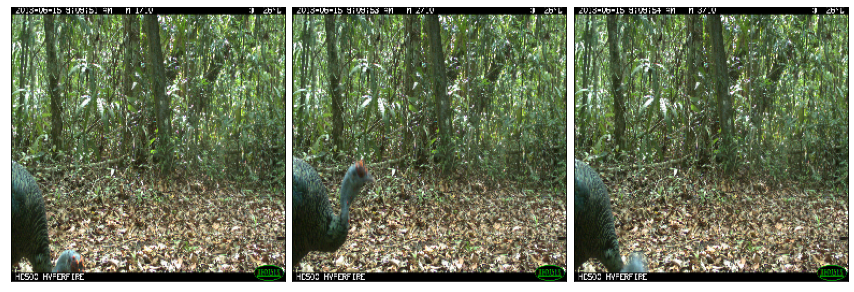

In [186]:
seqs = np.array(df_test_info["seq_id"].unique())
img_id = 12
imgs = np.array(df_test_info[df_test_info["seq_id"] == seqs[img_id]]["id"])
show = len(imgs)
fig = plt.figure(figsize=(15., (show/3) * 5.))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(int(show/3), 3),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )
size = (256, 256)
for ax, image_path in zip(grid, imgs):
    # Iterating over the grid returns the Axes.
    image_path = os.path.join(DATASET, "test", image_path+".jpg")
    ax.get_yaxis().set_ticks([])
    ax.get_xaxis().set_ticks([])
    ax.imshow(cv2.resize(cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB),size))

plt.show()

In [35]:
for i in df_test_info[:9]["id"]:
    print(i)
print(df_test_info[:11])

8b31d3be-21bc-11ea-a13a-137349068a90
8cf202be-21bc-11ea-a13a-137349068a90
8a87e62e-21bc-11ea-a13a-137349068a90
8e6994f4-21bc-11ea-a13a-137349068a90
948b29e2-21bc-11ea-a13a-137349068a90
8737aba8-21bc-11ea-a13a-137349068a90
918ca6a8-21bc-11ea-a13a-137349068a90
96d7ef64-21bc-11ea-a13a-137349068a90
90eac734-21bc-11ea-a13a-137349068a90
                                      id                                seq_id
0   8b31d3be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
1   8cf202be-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
2   8a87e62e-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
3   8e6994f4-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
4   948b29e2-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
5   8737aba8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
6   918ca6a8-21bc-11ea-a13a-137349068a90  a91ebc18-0cd3-11eb-bed1-0242ac1c0002
7   96d7ef64-21bc-11ea-a13a-1373490

Take right join on the image id.

In [41]:
sub_tmp = sub_tmp.merge(df_test_info, left_on="Id", right_on="id", how="right")

In [63]:
sub_tmp.head(10)

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,915879a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,91588116-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,9158a2f4-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9158aaa6-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9158f1a0-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,9159244a-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,91599f88-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,915a05ea-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,915a0cde-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9,915a41b8-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Since there are multiple lines for the same sequence ID. We should aggregate them to single line. In this case, we will choose the image with the highest number of animals shown and submit the animal species and the number of animals shown in that image.

In [60]:
sum_counts = []
for i in tqdm(range(len(sub_tmp))):
    sum_counts.append(sum(sub_tmp.iloc[i][col_Predicted]))
print(sum_counts)

 47%|████████████████▉                   | 5187/11057 [00:06<00:07, 757.34it/s]


TypeError: unsupported operand type(s) for +: 'int' and 'str'

In [44]:
sub_tmp["total"] =  sum_counts
sub_tmp = sub_tmp.sort_values('total', ascending=False)
sub_tmp = sub_tmp[~sub_tmp.duplicated(keep='first', subset='seq_id')].fillna("0")

In [45]:
sub_tmp

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571,id,seq_id,total
59868,91937e92-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91937e92-21bc-11ea-a13a-137349068a90,a917398e-0cd3-11eb-bed1-0242ac1c0002,6.0
14371,917d5b80-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,917d5b80-21bc-11ea-a13a-137349068a90,a925a870-0cd3-11eb-bed1-0242ac1c0002,4.0
20217,91764bb0-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91764bb0-21bc-11ea-a13a-137349068a90,a925bec8-0cd3-11eb-bed1-0242ac1c0002,4.0
32018,9174204c-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,9174204c-21bc-11ea-a13a-137349068a90,a924d558-0cd3-11eb-bed1-0242ac1c0002,4.0
44759,91706fc4-21bc-11ea-a13a-137349068a90,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,91706fc4-21bc-11ea-a13a-137349068a90,a9190016-0cd3-11eb-bed1-0242ac1c0002,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60115,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8c3b0424-21bc-11ea-a13a-137349068a90,9500e290-21bc-11ea-a13a-137349068a90,0
60148,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,8d2b546a-21bc-11ea-a13a-137349068a90,386634a2-6fe2-11eb-844f-0242ac1c0002,0
60158,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,902c630c-21bc-11ea-a13a-137349068a90,982a8f20-21bc-11ea-a13a-137349068a90,0
60167,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,867fbf02-21bc-11ea-a13a-137349068a90,92c82344-21bc-11ea-a13a-137349068a90,0


I'll match the result to the sample submission format. I was told that the order of the rows is not related to the score, but we will match it just in case.

In [46]:
# Since it was difficult to join the pandas series, I intentionally created an extra column.
sub = sub.reset_index()
sub = sub[["index", "Id"]].merge(sub_tmp, left_on="Id", right_on="seq_id")

In [47]:
sub = sub[["Id_x"] + col_Predicted].rename(columns={"Id_x": "Id"})

In [67]:
sub.to_csv("./zero_baseline_real.csv", index=False)
sub.head()

,Id,Predicted2,Predicted3,Predicted4,Predicted6,Predicted7,Predicted8,Predicted9,Predicted10,Predicted12,...,Predicted559,Predicted562,Predicted563,Predicted564,Predicted565,Predicted566,Predicted567,Predicted568,Predicted570,Predicted571
0,32ce8026-7ec9-11eb-b675-4f3cc0c82eb3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,945c6602-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,a91c7e26-0cd3-11eb-bed1-0242ac1c0002,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,9926239e-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,9672184c-21bc-11ea-a13a-137349068a90,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
# zero everything
for col in sub.columns[1:]:
    sub[col] = 0
    print(col, np.sum(np.array(sub[col]).astype("float")))

Predicted2 0.0
Predicted3 0.0
Predicted4 0.0
Predicted6 0.0
Predicted7 0.0
Predicted8 0.0
Predicted9 0.0
Predicted10 0.0
Predicted12 0.0
Predicted13 0.0
Predicted14 0.0
Predicted15 0.0
Predicted16 0.0
Predicted20 0.0
Predicted24 0.0
Predicted25 0.0
Predicted26 0.0
Predicted32 0.0
Predicted44 0.0
Predicted50 0.0
Predicted62 0.0
Predicted67 0.0
Predicted70 0.0
Predicted71 0.0
Predicted72 0.0
Predicted73 0.0
Predicted74 0.0
Predicted77 0.0
Predicted78 0.0
Predicted80 0.0
Predicted83 0.0
Predicted86 0.0
Predicted89 0.0
Predicted90 0.0
Predicted91 0.0
Predicted92 0.0
Predicted94 0.0
Predicted96 0.0
Predicted97 0.0
Predicted98 0.0
Predicted99 0.0
Predicted100 0.0
Predicted101 0.0
Predicted102 0.0
Predicted103 0.0
Predicted104 0.0
Predicted106 0.0
Predicted108 0.0
Predicted110 0.0
Predicted111 0.0
Predicted112 0.0
Predicted113 0.0
Predicted114 0.0
Predicted115 0.0
Predicted116 0.0
Predicted118 0.0
Predicted119 0.0
Predicted120 0.0
Predicted121 0.0
Predicted122 0.0
Predicted123 0.0
Predicted12

In [57]:
sub.columns

Index(['Id', 'Predicted2', 'Predicted3', 'Predicted4', 'Predicted6',
       'Predicted7', 'Predicted8', 'Predicted9', 'Predicted10', 'Predicted12',
       ...
       'Predicted559', 'Predicted562', 'Predicted563', 'Predicted564',
       'Predicted565', 'Predicted566', 'Predicted567', 'Predicted568',
       'Predicted570', 'Predicted571'],
      dtype='object', length=205)